# Redefiniendo al Análisis Local con Python: De Jupyter a Web en minutos.

1. Introducción
2. Elementos Esenciales.
<!-- 3. Jupyter
4. DuckDB
5. Pandas
6. Plotly
7. Dash -->

La intención de la pláticas es mostrar un entorno muy eficiente y lo menos configurable posible para poder trabajar rápido analizando datos
DuckDb no necesita configuración y es un OLAP

## Introducción

* Qué
* Dónde
* Porqué


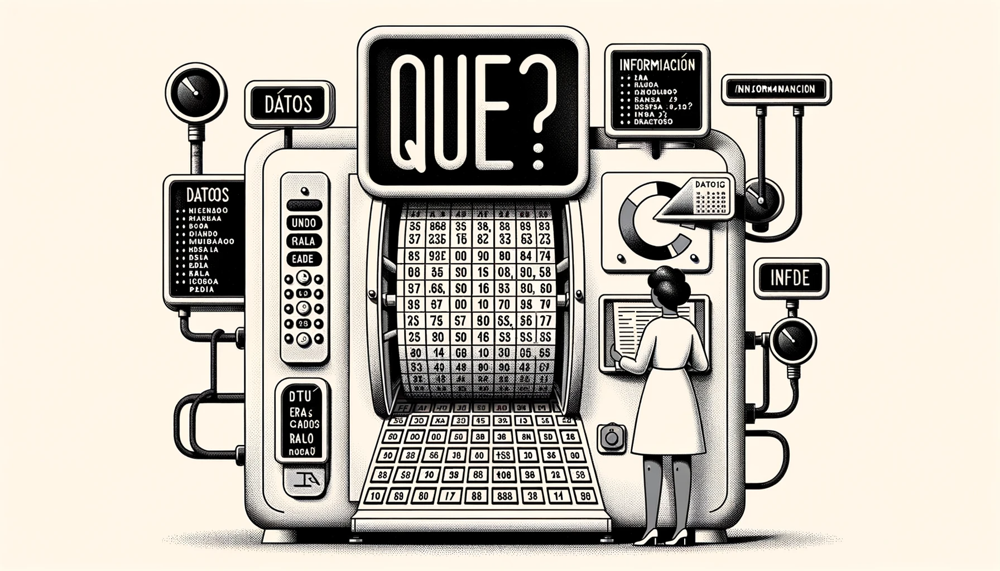

## Qué

El análisis de datos se refiere al proceso de inspeccionar, limpiar y transformar datos con el objetivo de descubrir información, normalmente para apoyar a la toma de decisiones.


**Ejemplo:** Imagina que eres un ingeniero de Spotify y deseas entender que géneros musicales son los más populares entre los usuarios de 18 y 25 años.

Usando análisis de datos podrías identificar tendencias a través del tiempo, incluso crear listas de datos personalizadas y mejorar la experiencia del usuario.


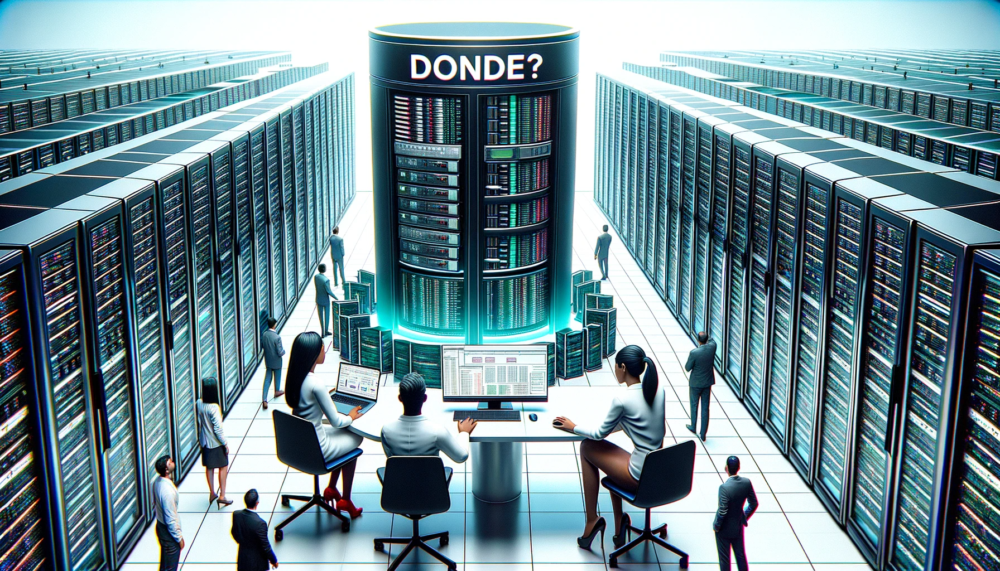

## Dónde

La Nube vs Local

Los principales servicios de nube (AWS, Google Cloud, Azure) ofrecen poderosas herramientas para el análisis de datos, como AWS S3 para almacenar estos datos, SageMaker y Google Collab para el análisis.

En Local los datos se almacenan y procesan en tu máquina personal, con el avance de la técnología (optimizaciones en librerías y hardware) ahora es factible analizar grandes conjuntos de datos localmente.


Nota: Dar a entender que solo quiero que liberen el potencial de sus máquinas locales, no estoy promoviendo no usar los servicios de nube para PROD

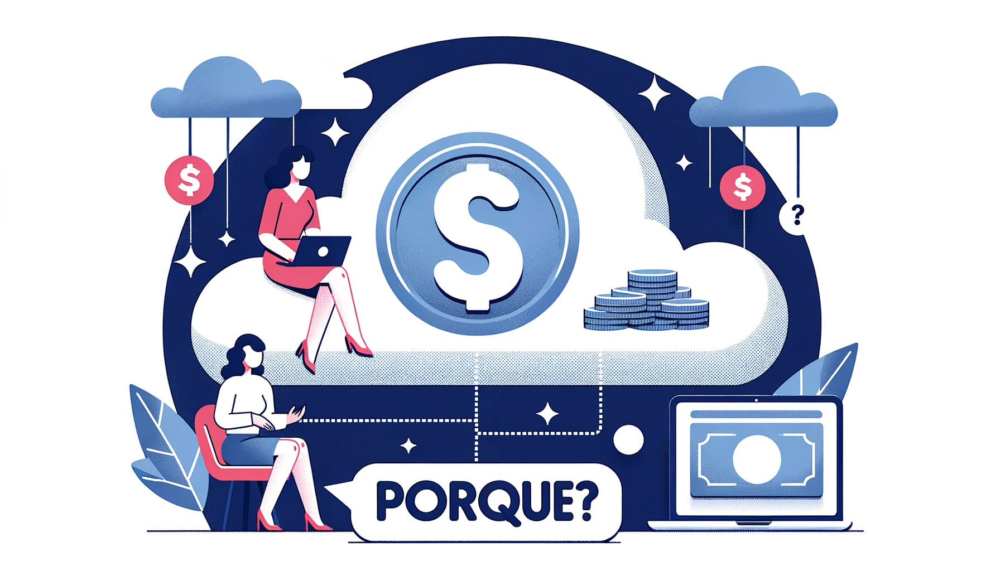

## Porqué

Costo: Las soluciones en la nube a menudo tienen costos asociados al almacenamiento, transferencia y procesamiento. Trbajar localmente en proyectos "pequeños" puede ser mas rentable.

Control: Tener tus datos y herramientas de análisis local te da control total sobre ellos, **NO** tienes que preocuparte por **configuraciones, permisos ni brechas de seguridad de servicios.**

Con tu laptop moderna y 16 GB (o más) de RAM, puedes utilizar librerías como DuckDB para analizar datasets que antes eran inmanejables en un entorno local. 


# Elementos Esenciales.

1. Entorno de desarrollo.
2. Datos y Herramientas.
3. Presentación de datos.

## Entorno de desarrollo

El mejor entorno de desarrollo para análisis de datos local es **Jupyter**.


![](imagenes/img.png)


1. Es un entorno **interactivo**, ideal para la **exploración**. Puedes ejecutar código y ver los resultados en tiempo real.
2. Puede usar texto enriquecido **(Markdown, Latex, HTML)**, lo que permite generar buenos documentos para colaboración.
3. Soporta multiples lenguajes no solo Python **(R, Julia, Scala)**
4. Integración con herramientas de **análisis de datos y visualización**.
5. Se puede extender y customizar (Gran comunidad y ecosistema, **extensiones, plugins**.)



### Ejemplo:

In [2]:
import pandas as pd

# Carga de datos
ventas = pd.read_csv("../data/ejemplo-ventas/ventas.csv")

# Mostrar las primeras 5 filas para explorar
ventas.head()

,fecha,producto,costos,venta_total
0,2023-01-01,Manzana,1.0,1.50
1,2023-01-01,Plátano,0.6,0.90
2,2023-01-01,Zanahoria,0.5,0.80
3,2023-01-02,Manzana,1.0,1.40
4,2023-01-02,Plátano,0.6,0.85


Si definimos:
- \( P \) como el precio de venta al público.
- \( C \) como el costo del producto.

Entonces, la ganancia \( G \) por producto vendido se calculará como:

$$ G = P - C $$


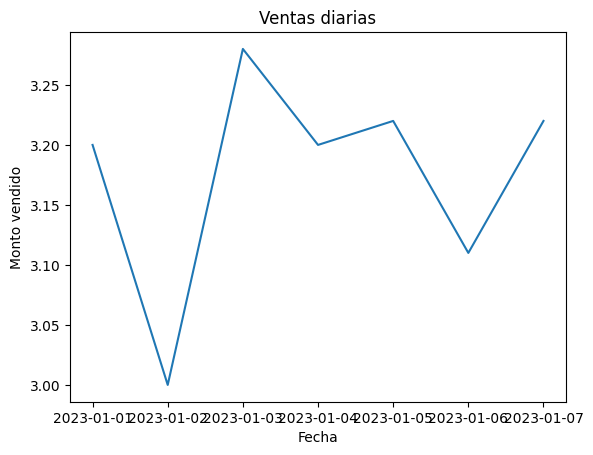

In [3]:
import matplotlib.pyplot as plt

# plt.figure(figsize=(8, 6))
# plt.style.use('ggplot')

# Gráfico simple de ventas por día
ventas.groupby('fecha')['venta_total'].sum().plot()
plt.title('Ventas diarias')
plt.ylabel('Monto vendido')
plt.xlabel('Fecha')
# plt.tight_layout()
plt.show()


Nota: mover el figsize para demostrar que podemos interactuar en tiempo real, tambien hacer referencia a que mi presentación es un notebook

In [4]:
%%time 
ganancia = ventas['venta_total'].sum() - ventas['costos'].sum()
print(ganancia)


7.530000000000001
CPU times: user 407 µs, sys: 355 µs, total: 762 µs
Wall time: 756 µs


In [5]:
# Lista de todos los magic commands disponibles
%lsmagic

Available line magics:
%alias  %alias_magic  %autoawait  %autocall  %automagic  %autosave  %bookmark  %cat  %cd  %clear  %colors  %conda  %config  %connect_info  %cp  %debug  %dhist  %dirs  %doctest_mode  %ed  %edit  %env  %gui  %hist  %history  %killbgscripts  %ldir  %less  %lf  %lk  %ll  %load  %load_ext  %loadpy  %logoff  %logon  %logstart  %logstate  %logstop  %ls  %lsmagic  %lx  %macro  %magic  %man  %matplotlib  %mkdir  %more  %mv  %notebook  %page  %pastebin  %pdb  %pdef  %pdoc  %pfile  %pinfo  %pinfo2  %pip  %popd  %pprint  %precision  %prun  %psearch  %psource  %pushd  %pwd  %pycat  %pylab  %qtconsole  %quickref  %recall  %rehashx  %reload_ext  %rep  %rerun  %reset  %reset_selective  %rm  %rmdir  %run  %save  %sc  %set_env  %store  %sx  %system  %tb  %time  %timeit  %unalias  %unload_ext  %who  %who_ls  %whos  %xdel  %xmode

Available cell magics:
%%!  %%HTML  %%SVG  %%bash  %%capture  %%debug  %%file  %%html  %%javascript  %%js  %%latex  %%markdown  %%perl  %%prun  %%pypy  %%

## Datos y Herramientas

## DuckDB

![](imagenes/duck-db.png)

Que és?

Es una "In-process" OLAP DBMS.



### In-process

Significa que opera en el mismo proceso que el cliente (No hay comunicación con un servidor externo).

* NO latencia
* NO credenciales o conexión
* SÍ eficiencia
* SÍ portabilidad



### OLAP  (Online Analytical Processing)

Sistemas diseñados principalmente para consultas y análisis complejos sobre grandes volumenes de datos.

Están optimizados para realizar operaciones como agregaciones, filtrados y JOINs.

### DBMS (Database Management System)

Es un sistema software diseñado para gestionar bases de datos.
Proporciona interfaces para que los usuarios o aplicaciones puedan interactuar, consultar y modificar los datos almacenados.


### OLAP vs OLTP

OLTP (Online Transaction Processing) se refiere a sistemas optimizados para transacciones: operaciones de corta duración que suelen implicar la lectura y modificación de una pequeña cantidad de registros.

OLTP Maneja muchas transacciones cortas (insert, update, delete).

OLAP Maneja consultas complejas que involucran la lectura de grandes volúmenes de datos (Normalmente usando técnicas de vectorizado).

OLAP está optimizado para consultas, mientras que OLTP está optimizado para transacciones.

![](imagenes/olap.png)


### DuckDB es el SQLite para análisis de datos.

Nota: Hay que decir que DuckDb trabaja en memoria pero tambien se pueden persistir datos en el disco duro

## Pandas 

![](imagenes/pandas.png)

Es una biblioteca que proporciona estructuras de datos y herramientas de análisis de datos.

Pandas es capaz de leer de diferentes fuentes como archivos: parquet, csv, SQL, entre otros, además cuenta con herramientas para trabajar con series de tiempo.

## Estructuras de Datos

**Series:** Una estructura unidimensional similar a un vector, lista o columna en una tabla. Cada elemento tiene un índice asociado.
**DataFrame:** Una estructura bidimensional similar a una hoja de cálculo o una tabla SQL. Es básicamente una colección de Series que comparten un índice común.

## Plotly

![](imagenes/plotly.png)

Es una biblioteca de visualización de datos, produce gráficos de alta calidad que tambien se pueden embeber en aplicaciones web.

Las visualizaciones que genera son dinámicas.


In [6]:
import pandas as pd
import plotly.express as px

In [10]:
df = pd.read_csv('../data/ejemplo-ventas/ventas.csv')

# Gráfico interactivo de barras de las ventas totales por fecha y producto
fig = px.bar(df, x='fecha', y='venta_total', color='producto', title='Ventas Totales por Fecha y Producto', barmode='group')

fig.show()

In [1]:
import duckdb

In [2]:
data = "../data/QQP/QQP_2023/2023/*"

In [3]:
data_dtypes  = {
    "producto":	'TEXT',
    "presentacion":	'TEXT',
    "marca":	'TEXT',
    "categoria":	'TEXT',
    "catalogo":	'TEXT',
    "precio":	'REAL',
    "fecharegistro":	'TEXT',
    "cadenacomercial":	'TEXT',
    "giro":	'TEXT',
    "nombrecomercial":	'TEXT',
    "direccion":	'TEXT',
    "estado":	'TEXT',
    "municipio":	'TEXT',
    "latitud":	'TEXT',
    "longitud":	'TEXT'
}

In [4]:
con = duckdb.connect('file.db')

In [5]:
test = duckdb.read_csv(data, names=list(data_dtypes), all_varchar=True)

In [6]:
test

┌─────────────────┬──────────────────────┬──────────────────────┬───┬────────────────┬───────────┬─────────────┐
│    producto     │     presentacion     │        marca         │ … │   municipio    │  latitud  │  longitud   │
│     varchar     │       varchar        │       varchar        │   │    varchar     │  varchar  │   varchar   │
├─────────────────┼──────────────────────┼──────────────────────┼───┼────────────────┼───────────┼─────────────┤
│ ACEITE          │ BOTELLA 1 LT. VEGE…  │ 1-2-3                │ … │ AGUASCALIENTES │ 21.916001 │ -102.290779 │
│ ACEITE          │ BOTELLA 850 ML. VE…  │ AVE                  │ … │ AGUASCALIENTES │ 21.916001 │ -102.290779 │
│ ACEITE          │ BOTELLA 840 ML. CA…  │ CAPULLO              │ … │ AGUASCALIENTES │ 21.916001 │ -102.290779 │
│ ACEITE          │ BOTELLA 765 ML. MAÍZ │ MAZOLA               │ … │ AGUASCALIENTES │ 21.916001 │ -102.290779 │
│ ACEITE          │ BOTELLA 850 ML. SOYA │ NUTRIOLI             │ … │ AGUASCALIENTES │ 21.916001

In [7]:
con.execute('CREATE TABLE qpp AS SELECT * FROM test')

CatalogException: Catalog Error: Table with name "qpp" already exists!

In [14]:
xxx= con.query(

    """

    SELECT 

        nullif(producto, NULL) as producto,
        nullif(presentacion, NULL) as presentacion,
        nullif(marca, NULL) as marca,
        nullif(categoria, NULL) as categoria,
        nullif(catalogo, NULL) as catalogo,
        nullif(precio, NULL) as precio,
        nullif(fecharegistro, NULL) as fecharegistro,
        nullif(cadenacomercial, NULL) as cadenacomercial,
        nullif(giro, NULL) as giro,
        nullif(nombrecomercial, NULL) as nombrecomercial,
        nullif(direccion, NULL) as direccion,
        nullif(estado, NULL) as estado,
        nullif(municipio, NULL) as municipio,
        nullif(latitud, NULL) as latitud,
        nullif(longitud, NULL) as longitud
        
    from test
    where latitud like 'NU%'
    
    """
    
    
)

In [15]:
xxx

┌──────────────────────┬──────────────────────┬──────────────────────┬───┬───────────┬─────────┬──────────┐
│       producto       │     presentacion     │        marca         │ … │ municipio │ latitud │ longitud │
│       varchar        │       varchar        │       varchar        │   │  varchar  │ varchar │ varchar  │
├──────────────────────┼──────────────────────┼──────────────────────┼───┼───────────┼─────────┼──────────┤
│ TORTILLA DE MAIZ     │ 1 KG. GRANEL         │ S/M                  │ … │ SALTILLO  │ NULL    │ NULL     │
│ GABAPENTINA          │ CAJA CON 15 CAPSUL…  │ S/M                  │ … │ SALTILLO  │ NULL    │ NULL     │
│ GENTAMICINA          │ CAJA CON 1 AMPOLLE…  │ S/M                  │ … │ SALTILLO  │ NULL    │ NULL     │
│ GLIBENCLAMIDA        │ 50 TABLETAS DE 5 MG. │ S/M                  │ … │ SALTILLO  │ NULL    │ NULL     │
│ GLIBENCLAMIDA        │ CAJA CON 50 TABLET…  │ S/M                  │ … │ SALTILLO  │ NULL    │ NULL     │
│ GLIMEPIRIDA          │ CAJ

In [73]:
con.close()